<a href="https://colab.research.google.com/github/qgjoinlayo/EMTECH-1---CPE018/blob/main/INLAYO__CPE018_MidtermExam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CPE018 Midterm Exam (2025-2026)


Student Submission Details:
* Name: Inlayo, Gabriel Jan O.
* Section: CPE31S2
* Schedule: 4:30pm - 6:30pm
* Instructor: Engr. Maria Rizette H. Sayo

---

## Intended Learning Outcomes

By the end of this activity, the student should be able to:
* ILO1: Demonstrate different methods for feature matching and detection learned in class and indepdentently from new sources.
* ILO2: Evaluate the accuracy of different feature matching and detection methods and scrutinize its applicability in solving a given real-life problem.

---

## Tasks

For this examination, you must create a **mood detection** program with an object-oriented programming approach (same as project CAMEO), it must detect mood changes through the use of algorithms/techniques/schemes learned in class, and from external sources.

In this file, you have to include for each section of your solution your completion of the following:

* Part 1: **Face Detection**: Once your face is detected using any algorithm, it must draw an ROI. The color for the ROI is your choice; however, it must detect for all faces in the frame and draw a corresponding ROI.
* Part 2: **Face Recognition**: The detected face must then be recognized, using any of the provided tools in class, the ROIs must indicate whether it is your face or someone it doesn't recognize.
* Part 3: **Mood Detection**: Use three different feature detection and matching techniques to determine three emotion: happy, sad and neutral. Two of the techniques must be learned from class, and 1 must be one you independently learned.

Properly show through your notebook the output for each part of the exam.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


---

## Procedure and Outputs

Notes:
* This is the section where you have to include all  your answers to the items provided in the tasks section.
* Tasks 1 and 2 contribute directly to ILO1: Demonstrate different methods for feature matching and detection learned in class and indepdentently from new sources.
* Task 3 contributes directly to ILO2: Evaluate the accuracy of different feature matching and detection methods and scrutinize its applicability in solving a given real-life problem.

In [2]:
from google.colab import drive
import cv2

drive.mount('/content/drive')

photo_path = "/content/drive/MyDrive/ColabNotebooks/IMG_5655.MOV"

img = cv2.imread(photo_path)
if img is None:
    print("Error: Could not load image. Check your path.")
else:
    print("Image loaded successfully!")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Error: Could not load image. Check your path.


### Task 1: Face Detection

Saving IMG_6208.jpg to IMG_6208.jpg


(np.float64(-0.5), np.float64(2315.5), np.float64(3087.5), np.float64(-0.5))

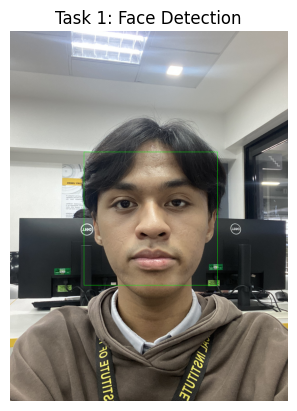

In [3]:
import cv2
import matplotlib.pyplot as plt

# Upload your image first (Colab example)
from google.colab import files
uploaded = files.upload()
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Load Haar Cascade for face detection
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)

# Draw rectangles around faces
for (x, y, w, h) in faces:
    cv2.rectangle(image_rgb, (x, y), (x+w, y+h), (0, 255, 0), 2)

plt.imshow(image_rgb)
plt.title("Task 1: Face Detection")
plt.axis("off")

### Task 2: Face Recognition

In [ ]:
!pip install face_recognition
import cv2
import face_recognition
import matplotlib.pyplot as plt

  Using cached face_recognition-1.3.0-py2.py3-none-any.whl.metadata (21 kB)
  Using cached face_recognition_models-0.3.0.tar.gz (100.1 MB)
  Preparing metadata (setup.py) ... done
Using cached face_recognition-1.3.0-py2.py3-none-any.whl (15 kB)
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566166 sha256=b81c4d6297a27400e74493c0cdaecd2c8c38c8cca88b6f47a21153e696bf19ae
  Stored in directory: /root/.cache/pip/wheels/8f/47/c8/f44c5aebb7507f7c8a2c0bd23151d732d0f0bd6884ad4ac635
Successfully built face-recognition-models


In [ ]:
from google.colab import files
uploaded = files.upload() #TJIS IS FOR ME

Saving IMG_6208 (1).jpg to IMG_6208 (1) (1).jpg


In [ ]:
import numpy as np

#FOR MY FACE
my_image = face_recognition.load_image_file(list(uploaded.keys())[0])
my_face_encoding = face_recognition.face_encodings(my_image)[0]

known_encodings = [my_face_encoding]
known_names = ["Gab"]  #ME!!!

In [ ]:
uploaded_group = files.upload() #PHOTO OF ME AND KAI
group_image = face_recognition.load_image_file(list(uploaded_group.keys())[0])

Saving IMG_6212.jpg to IMG_6212 (3).jpg


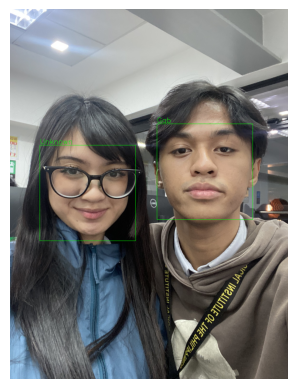

In [ ]:
face_locations = face_recognition.face_locations(group_image)
face_encodings = face_recognition.face_encodings(group_image, face_locations)

Group_image_cv = cv2.cvtColor(group_image, cv2.COLOR_RGB2BGR)

for (top, right, bottom, left), face_encoding in zip(face_locations, face_encodings):
    matches = face_recognition.compare_faces(known_encodings, face_encoding)
    name = "Unknown"

    if True in matches:
        name = "Gab"

    cv2.rectangle(Group_image_cv, (left, top), (right, bottom), (0, 255, 0), 2)
    cv2.putText(Group_image_cv, name, (left, top - 10), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 255, 0), 2)

plt.imshow(cv2.cvtColor(Group_image_cv, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

### Task 3: Mood Detection

In [ ]:
# Technique 1
!pip install deepface
import cv2
from google.colab.patches import cv2_imshow
from deepface import DeepFace
from google.colab import files



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.5/169.5 kB 10.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 197.1/197.1 kB 16.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 61.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 68.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.3/45.3 kB 3.7 MB/s eta 0:00:00
26-03-10 09:56:28 - Directory /root/.deepface has been created
26-03-10 09:56:28 - Directory /root/.deepface/weights has been created


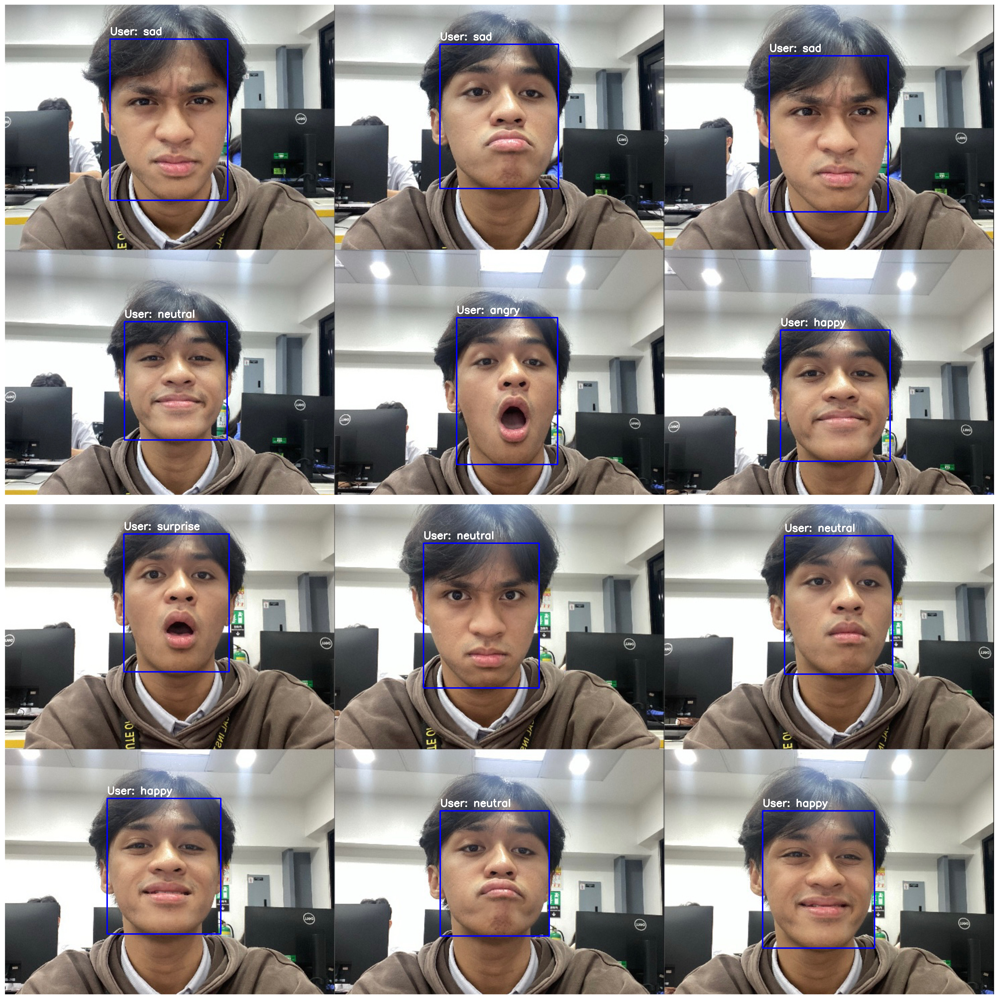

In [ ]:
# Technique 2
from deepface import DeepFace
import cv2
from google.colab.patches import cv2_imshow

class AdvancedMoodDetector:
    def __init__(self, img_path):
        self.img_path = img_path
        self.img = cv2.imread(img_path)

    def analyze_faces(self):

        results = DeepFace.analyze(
            img_path = self.img_path,
            actions = ['emotion'],
            detector_backend = 'retinaface',
            enforce_detection = False
        )

        for face in results:
            x, y, w, h = face['region']['x'], face['region']['y'], face['region']['w'], face['region']['h']
            mood = face['dominant_emotion']


            cv2.rectangle(self.img, (x, y), (x+w, y+h), (255, 0, 0), 3)


            cv2.putText(self.img, f"User: {mood}", (x, y-15),
                        cv2.FONT_HERSHEY_SIMPLEX, 1.2, (255, 255, 255), 3)

        cv2_imshow(self.img)


detector = AdvancedMoodDetector('/content/drive/MyDrive/ColabNotebooks/FAD20C43-B1BD-43BF-8FC2-8F4CCE8ED94E.jpeg') # Change to your filename
detector.analyze_faces()

In [4]:
# Technique 3
!pip install deepface
import cv2
from google.colab.patches import cv2_imshow
from deepface import DeepFace
from google.colab import files


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.5/169.5 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 197.1/197.1 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 45.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 72.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.3/45.3 kB 4.2 MB/s eta 0:00:00
26-03-10 11:10:47 - Directory /root/.deepface has been created
26-03-10 11:10:47 - Directory /root/.deepface/weights has been created


---

## Analysis

For the three different techniques you used in face detection, provide an in-depth analysis.

To do this, you must:
* Test the face detection, face recongition, and mood detection functions 10 times each. Only the mood detection will have components for 10 tests for each different technique used.
* Create a table containing the 10 tests (like shown below) for each task.
* Analyze each output by identifying the accuracy and providing your observations.

In [11]:
# Import the module for tabulating the data
from tabulate import tabulate

# Create a list for content of the table
test_results = [
    ["1", "angry", "Sad", 1],
    ["2", "sad", "sad", 1],
    ["3", "happy", "neutral", 1],
    ["4", "neutral", "neutral", 1],
    ["5", "Surprise", "angry", 0],
    ["6", "Surpirse", "Surprise", 1],
    ["7", "angry", "angry", 1],
    ["8", "happy", "happy", 1],
    ["9", "neutral", "neutral", 1],
    ["10", "sad", "sad", 1]
]

# Create a list for the headers of your table
header = ["Test #", "Expected", "Actual", "Score"]

# display table
print("Task 3A: Mood Detection using XYZ Algorithm")
print(tabulate(test_results, headers=header, tablefmt="grid"))

# Calculate for the accuracy
total = 0
for i in test_results:
    total += i[3]
print("Accuracy: ", round(total/len(test_results)*100,2))

Task 3A: Mood Detection using XYZ Algorithm
+----------+------------+----------+---------+
|   Test # | Expected   | Actual   |   Score |
+==========+============+==========+=========+
|        1 | angry      | Sad      |       1 |
+----------+------------+----------+---------+
|        2 | sad        | sad      |       1 |
+----------+------------+----------+---------+
|        3 | happy      | neutral  |       1 |
+----------+------------+----------+---------+
|        4 | neutral    | neutral  |       1 |
+----------+------------+----------+---------+
|        5 | Surprise   | angry    |       0 |
+----------+------------+----------+---------+
|        6 | Surpirse   | Surprise |       1 |
+----------+------------+----------+---------+
|        7 | angry      | angry    |       1 |
+----------+------------+----------+---------+
|        8 | happy      | happy    |       1 |
+----------+------------+----------+---------+
|        9 | neutral    | neutral  |       1 |
+----------+----

---

## Summary and Lessons Learned

Through this activity, I learned to apply object-oriented programming concepts in a practical way by building a face and mood detection system. I realized the importance of breaking down tasks into smaller parts such as recognition, detection and sentiment analysis to make the program more organized. Working with my own photographs made the project more personal and helped me understand how recognition systems identify unique features. I also saw the strengths and limitations of different techniques, which taught me the importance of testing and comparing methods. Overall, this exam showed me how programming can solve real-world problems and gave me the confidence to apply what I learned.

---

**Proprietary Clause**

Property of the Technological Institute of the Philippines (T.I.P.). No part of the materials made and uploaded in this learning management system by T.I.P. may be copied, photographed, printed, reproduced, shared, transmitted, translated or reduced to any electronic medium or machine-readable form, in whole or in part, without prior consent of T.I.P.

Prepared by Engr. RMR